In [1]:
!pip install wandb pyyaml opencv-python;

In [2]:
import os
import yaml
import glob
import numpy as np
import cv2
import tensorflow as tf
from tensorflow.keras import layers, models
import wandb
from wandb.integration.keras import WandbCallback
import matplotlib.pyplot as plt
import pandas as pd
from PIL import Image

2025-05-24 05:48:40.508512: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-24 05:48:40.527070: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-24 05:48:40.532566: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-24 05:48:40.546578: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-05-24 05:48:41.367588: W tensorflow/compiler/tf2

In [3]:
wandb.login(key="017feefe0af6702cda76aab121ec71cf3a362fec")

wandb: ERROR Failed to detect the name of this notebook. You can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /home/jovyan/.netrc
wandb: Currently logged in as: samutheman (rueedi-tobias-hochschule-luzern) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


True

In [4]:
dataset_yaml = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/data.yaml"
images_trainset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/train"
labels_trainset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/train"
images_valset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/val"
labels_valset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/val"
images_testset = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/images/test"
test_csv_path = "/exchange/dspro2/M-AI-ZE/data/adjusted/1.1/splits/SID01/labels/test/bboxes_test.csv"


In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

In [6]:
# --- Parameters (tweak these to your dataset) ---
IMG_SIZE    = 516
GRID_SIZE   = 16
NUM_CLASSES = 1   #
NUM_BOXES   = 3    # number of anchors per cell
OUTPUT_SHAPE = (GRID_SIZE, GRID_SIZE, NUM_BOXES * (5 + NUM_CLASSES))

In [7]:
def build_yolo_model(input_shape=(IMG_SIZE, IMG_SIZE, 3)):
    inputs = tf.keras.Input(shape=input_shape)

    def conv_bn_leaky(x, filters):
        x = layers.Conv2D(filters, 3, padding='same', use_bias=False)(x)
        x = layers.BatchNormalization()(x)
        return layers.LeakyReLU(alpha=0.1)(x)

    x = conv_bn_leaky(inputs, 16)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 32)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 64)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 128)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 256)
    x = layers.Dropout(0.3)(x)
    x = layers.MaxPool2D(2)(x)

    x = conv_bn_leaky(x, 512)
    x = layers.Dropout(0.3)(x)

    # Final prediction conv
    x = layers.Conv2D(
        NUM_BOXES * (5 + NUM_CLASSES),
        kernel_size=1,
        padding='same',
        activation='sigmoid'  # or linear + custom loss
    )(x)

    # Check shape compatibility
    output = layers.Reshape((GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))(x)

    return tf.keras.Model(inputs, output)


In [8]:
# --- YOLO loss with binary class ---
def yolo_loss(y_true, y_pred):
    # reshape to (..., S, S, B, 5 + C)
    pred = tf.reshape(y_pred, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    true = tf.reshape(y_true, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    obj_mask = true[..., 4:5]

    # localization losses
    xy_loss = tf.reduce_sum(obj_mask * tf.square(true[..., 0:2] - pred[..., 0:2]))
    wh_loss = tf.reduce_sum(obj_mask * tf.square(
        tf.sqrt(true[..., 2:4] + 1e-6) - tf.sqrt(pred[..., 2:4] + 1e-6)
    ))

    # objectness and class losses
    obj_loss = tf.reduce_sum(
        tf.keras.losses.binary_crossentropy(true[..., 4:5], pred[..., 4:5])
    )
    class_bce = tf.keras.losses.binary_crossentropy(true[..., 5:], pred[..., 5:])
    class_bce = tf.expand_dims(class_bce, axis=-1)
    class_loss = tf.reduce_sum(obj_mask * class_bce)

    return xy_loss + wh_loss + obj_loss + class_loss

In [9]:
def area_difference_loss(y_true, y_pred):

    pred = tf.reshape(y_pred, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))
    true = tf.reshape(y_true, (-1, GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES))


    pred_area = pred[..., 2] * pred[..., 3] * pred[..., 4]
    true_area = true[..., 2] * true[..., 3] * true[..., 4]


    total_pred_area = tf.reduce_sum(pred_area)
    total_true_area = tf.reduce_sum(true_area)


    return tf.abs(total_pred_area - total_true_area)

In [10]:
def combined_yolo_area_loss(y_true, y_pred, area_weight=0.01):

    yolo = yolo_loss(y_true, y_pred)

    area = area_difference_loss(y_true, y_pred)

    return yolo + area_weight * area

In [11]:
def apply_nms(pred_grid, conf_thresh=0.3, iou_thresh=0.4):
    boxes = []
    scores = []

    for gy in range(GRID_SIZE):
        for gx in range(GRID_SIZE):
            for b in range(NUM_BOXES):
                pred = pred_grid[gy, gx, b]
                conf = pred[4]
                if conf < conf_thresh:
                    continue

                x, y, w, h = pred[:4]
                cx = (gx + x) / GRID_SIZE
                cy = (gy + y) / GRID_SIZE
                xmin = cx - w / 2
                ymin = cy - h / 2
                xmax = cx + w / 2
                ymax = cy + h / 2

                boxes.append([ymin, xmin, ymax, xmax])
                scores.append(conf)

    if not boxes:
        return [], []

    boxes = tf.constant(boxes, dtype=tf.float32)
    scores = tf.constant(scores, dtype=tf.float32)

    selected_indices = tf.image.non_max_suppression(
        boxes,
        scores,
        max_output_size=10,
        iou_threshold=iou_thresh,
        score_threshold=conf_thresh
    )

    selected_boxes = tf.gather(boxes, selected_indices).numpy()
    selected_scores = tf.gather(scores, selected_indices).numpy()

    return selected_boxes, selected_scores



In [12]:
def build_yolo_label_grid(label_path, grid_size, num_boxes, num_classes):
    label_grid = np.zeros((grid_size, grid_size, num_boxes, 5 + num_classes), dtype=np.float32)

    if not os.path.exists(label_path):
        return label_grid

    with open(label_path, "r") as f:
        for line in f:
            class_id, x, y, w, h = map(float, line.strip().split())
            gx = min(int(x * grid_size), grid_size - 1)
            gy = min(int(y * grid_size), grid_size - 1)
            cell_x = x * grid_size - gx
            cell_y = y * grid_size - gy

            anchor_idx = 0

            label_grid[gy, gx, anchor_idx, 0:5] = [cell_x, cell_y, w, h, 1.0]
            label_grid[gy, gx, anchor_idx, 5 + int(class_id)] = 1.0

    return label_grid

def prepare_image_label_paths(image_dir, label_dir, grid_size, num_boxes, num_classes):
    image_paths = sorted(glob.glob(os.path.join(image_dir, "*.jpg")))
    label_grids = []

    for img_path in image_paths:
        filename = os.path.splitext(os.path.basename(img_path))[0]
        label_path = os.path.join(label_dir, f"{filename}.txt")
        label_grid = build_yolo_label_grid(label_path, grid_size, num_boxes, num_classes)
        label_grids.append(label_grid)

    return image_paths, np.array(label_grids, dtype=np.float32)


In [13]:
def parse_image_and_label(image_path, label_tensor, img_size):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, [img_size, img_size])
    img = img / 255.0

    # Explicit shape setting is critical here
    img.set_shape([img_size, img_size, 3])
    label_tensor.set_shape([GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES])

    return img, label_tensor


def make_yolo_dataset(image_paths, label_tensors, img_size, batch_size=4, shuffle=True):
    ds = tf.data.Dataset.from_tensor_slices((image_paths, label_tensors))
    
    if shuffle:
        ds = ds.shuffle(buffer_size=len(image_paths))
    
    def process(path, label):
        img = tf.io.read_file(path)
        img = tf.image.decode_jpeg(img, channels=3)
        img = tf.image.resize(img, [img_size, img_size])
        img = img / 255.0

        img.set_shape([img_size, img_size, 3])
        label.set_shape([GRID_SIZE, GRID_SIZE, NUM_BOXES, 5 + NUM_CLASSES])

        return img, label

    ds = ds.map(process, num_parallel_calls=tf.data.AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(tf.data.AUTOTUNE)
    return ds


In [14]:
def evaluate_loss(model, test_ds, batch_size=4):
    preds_all = model.predict(test_ds, verbose=1)

    total_loss = 0.0
    total_area_loss = 0.0
    num_batches = 0

    for i, (images, labels) in enumerate(test_ds):
        start = i * batch_size
        end = start + images.shape[0]
        preds = tf.convert_to_tensor(preds_all[start:end])

        area_loss = area_difference_loss(labels, preds).numpy()
        loss = combined_yolo_area_loss(labels, preds).numpy()

        total_area_loss += area_loss
        total_loss += loss
        num_batches += 1

    avg_loss = total_loss / num_batches if num_batches > 0 else 0
    avg_area_loss = total_area_loss / num_batches if num_batches > 0 else 0

    print(f"Average loss on test set: {avg_loss:.4f}")
    print(f"Average area loss on test set: {avg_area_loss:.4f}")

    wandb.log({
        "test_combined_loss": avg_loss,
        "test_area_difference_loss": avg_area_loss
    })

    return avg_loss


In [15]:
def create_label_grids_from_df(df, image_dir, grid_size, num_boxes, num_classes):
    df = df.copy()
    grouped = df.groupby("image")
    
    image_paths = []
    label_grids = []

    for img_name, group in grouped:
        img_path = os.path.join(image_dir, img_name)
        image_paths.append(img_path)

        label_grid = np.zeros((grid_size, grid_size, num_boxes, 5 + num_classes), dtype=np.float32)

        for _, row in group.iterrows():
            cx, cy = row["x_center"], row["y_center"]
            bw, bh = row["bb_width"], row["bb_height"]
            class_id = 0  # or use `row["class_id"]` if multi-class

            gx = min(int(cx * grid_size), grid_size - 1)
            gy = min(int(cy * grid_size), grid_size - 1)
            cell_x = cx * grid_size - gx
            cell_y = cy * grid_size - gy

            anchor_idx = 0  # assign to first anchor
            label_grid[gy, gx, anchor_idx, 0:5] = [cell_x, cell_y, bw, bh, 1.0]
            label_grid[gy, gx, anchor_idx, 5 + class_id] = 1.0

        label_grids.append(label_grid)

    return image_paths, np.array(label_grids, dtype=np.float32)


In [16]:
def add_image_size_to_df(df, image_size_dict):
    df = df.copy()
    df['original_img_width'] = df['image'].map(lambda img: image_size_dict[img][0])
    df['original_img_height'] = df['image'].map(lambda img: image_size_dict[img][1])
    return df

def prepare_bboxes(df):
    df = df.copy()
    df["x1"] = df["x1"] / df["original_img_width"]
    df["x2"] = df["x2"] / df["original_img_width"]
    df["y1"] = df["y1"] / df["original_img_height"]
    df["y2"] = df["y2"] / df["original_img_height"]

    df["x_center"] = (df["x1"] + df["x2"]) / 2
    df["y_center"] = (df["y1"] + df["y2"]) / 2
    df["bb_width"] = df["x2"] - df["x1"]
    df["bb_height"] = df["y2"] - df["y1"]
    
    return df

def get_image_size_dict(folder_path):
    image_size_dict = {}
    for filename in os.listdir(folder_path):
        if filename.lower().endswith('.jpg'):
            img = Image.open(os.path.join(folder_path, filename))
            image_size_dict[filename] = img.size

    return image_size_dict

In [17]:
bboxes_test= None
bboxes_df= None

In [18]:
bboxes_df = pd.read_csv(test_csv_path)
img_size_dict_test = get_image_size_dict(images_testset)
bboxes_test = add_image_size_to_df(bboxes_df, img_size_dict_test)
bboxes_test = prepare_bboxes(bboxes_test)

In [19]:
bboxes_test.head()

,image,x1,y1,x2,y2,user,day,month,year,hour,minute,type,original_img_width,original_img_height,x_center,y_center,bb_width,bb_height
0,DSC00976_0.jpg,0.612667,0.376,0.661333,0.4315,Tyr,12,12,2016,9,45,boom,3000,2000,0.637000,0.40375,0.048667,0.0555
1,DSC00976_0.jpg,0.652333,0.349,0.717000,0.4165,Tyr,12,12,2016,9,45,boom,3000,2000,0.684667,0.38275,0.064667,0.0675
2,DSC00976_0.jpg,0.626333,0.403,0.675667,0.4800,Tyr,12,12,2016,9,45,boom,3000,2000,0.651000,0.44150,0.049333,0.0770
3,DSC00976_0.jpg,0.576000,0.190,0.651333,0.2885,Tyr,12,12,2016,9,45,boom,3000,2000,0.613667,0.23925,0.075333,0.0985
4,DSC00976_0.jpg,0.569667,0.151,0.652333,0.2640,Tyr,12,12,2016,9,45,boom,3000,2000,0.611000,0.20750,0.082667,0.1130


In [20]:
test_image_paths, test_labels = create_label_grids_from_df(
    bboxes_test,
    images_testset,    
    GRID_SIZE,
    NUM_BOXES,
    NUM_CLASSES
)
test_ds = make_yolo_dataset(
    test_image_paths,
    test_labels,
    IMG_SIZE,
    batch_size=4,
    shuffle=False
)

2025-05-24 05:50:44.915636: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13294 MB memory:  -> device: 0, name: NVIDIA A16, pci bus id: 0000:e8:00.0, compute capability: 8.6


In [21]:
length = sum(1 for _ in test_ds)
print("Dataset length:", length)

Dataset length: 340


2025-05-24 05:51:26.833770: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [22]:
train_image_paths, train_labels = prepare_image_label_paths(
    images_trainset, labels_trainset, GRID_SIZE, NUM_BOXES, NUM_CLASSES
)

val_image_paths, val_labels = prepare_image_label_paths(
    images_valset, labels_valset, GRID_SIZE, NUM_BOXES, NUM_CLASSES
)


In [23]:
train_ds = make_yolo_dataset(train_image_paths, train_labels, IMG_SIZE, batch_size=4)
val_ds   = make_yolo_dataset(val_image_paths,   val_labels,   IMG_SIZE, batch_size=4, shuffle=False)

In [25]:
wandb.init(project="Own CNN", name="CNNModelWithAreaLoss")

In [26]:
model = build_yolo_model()
model.compile(optimizer='adam', loss=combined_yolo_area_loss)
model.summary()

/opt/conda/lib/python3.12/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 516, 516, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 516, 516, 16)   │           432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 516, 516, 16)   │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 516, 516, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 258, 258, 16)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 258, 258, 32)   │         4,608 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 258, 258, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 258, 258, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 129, 129, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 129, 129, 64)   │        18,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 129, 129, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 129, 129, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 64, 64, 128)    │        73,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 32, 32, 256)    │       294,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 32, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 32, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 1,585,026 (6.05 MB)

 Trainable params: 1,583,010 (6.04 MB)

 Non-trainable params: 2,016 (7.88 KB)

In [27]:
batch_size = 4  

model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[WandbCallback(save_graph=False, save_model=False)]
)

wandb: WARNING WandbCallback is deprecated and will be removed in a future release. Please use the WandbMetricsLogger, WandbModelCheckpoint, and WandbEvalCallback callbacks instead. See https://docs.wandb.ai/guides/integrations/keras for more information.


Epoch 1/10


I0000 00:00:1748065919.831474  437909 service.cc:146] XLA service 0x7efeb8006610 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1748065919.831528  437909 service.cc:154]   StreamExecutor device (0): NVIDIA A16, Compute Capability 8.6
2025-05-24 05:51:59.943157: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-05-24 05:52:00.274377: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2025-05-24 05:52:10.724992: W external/local_xla/xla/service/gpu/nvptx_compiler.cc:762] The NVIDIA driver's CUDA version is 12.2 which is older than the ptxas CUDA version (12.3.107). Because the driver is older than the ptxas version, XLA is disabling parallel compilation, which may slow down compilation. You should update your NVIDIA driver or use the NVIDIA-provided CUDA forward compatibility packages.


   5/2715 ━━━━━━━━━━━━━━━━━━━━ 1:34 35ms/step - loss: 3725.0640

I0000 00:00:1748065932.606835  437909 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


2715/2715 ━━━━━━━━━━━━━━━━━━━━ 127s 41ms/step - loss: 189.5088 - val_loss: 102.6536
Epoch 2/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 98s 36ms/step - loss: 87.2722 - val_loss: 90.1204
Epoch 3/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 98s 36ms/step - loss: 79.5520 - val_loss: 119.7328
Epoch 4/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 98s 36ms/step - loss: 74.1421 - val_loss: 80.8089
Epoch 5/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 98s 36ms/step - loss: 69.9487 - val_loss: 95.9824
Epoch 6/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 98s 36ms/step - loss: 66.8032 - val_loss: 70.9879
Epoch 7/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 98s 36ms/step - loss: 63.9518 - val_loss: 82.9304
Epoch 8/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 99s 36ms/step - loss: 62.7478 - val_loss: 91.7484
Epoch 9/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 99s 36ms/step - loss: 59.7659 - val_loss: 73.8961
Epoch 10/10
2715/2715 ━━━━━━━━━━━━━━━━━━━━ 99s 36ms/step - loss: 57.3679 - val_loss: 81.7578


In [28]:
evaluate_loss(model, test_ds)

340/340 ━━━━━━━━━━━━━━━━━━━━ 35s 100ms/step
Average loss on test set: 73.1783
Average area loss on test set: 0.1071


2025-05-24 06:10:03.443747: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


73.17830503407647

In [29]:
def draw_nms_boxes(image, label_grid, pred_boxes):
    img = (image * 255).astype(np.uint8).copy()
    h, w, _ = img.shape
    cell_h, cell_w = h // GRID_SIZE, w // GRID_SIZE

    for gy in range(GRID_SIZE):
        for gx in range(GRID_SIZE):
            for b in range(NUM_BOXES):
                if label_grid[gy, gx, b, 4] > 0.5:
                    x, y, bw, bh = label_grid[gy, gx, b, :4]
                    cx = int((gx + x) * cell_w)
                    cy = int((gy + y) * cell_h)
                    bw = int(bw * w)
                    bh = int(bh * h)
                    cv2.rectangle(img, (cx - bw // 2, cy - bh // 2), (cx + bw // 2, cy + bh // 2), (0, 255, 0), 2)

    for box in pred_boxes:
        ymin, xmin, ymax, xmax = box
        x1 = int(xmin * w)
        y1 = int(ymin * h)
        x2 = int(xmax * w)
        y2 = int(ymax * h)
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)

    return img



1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


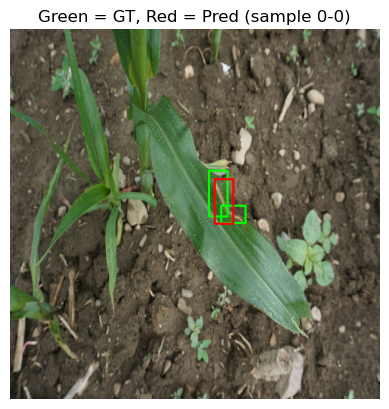

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


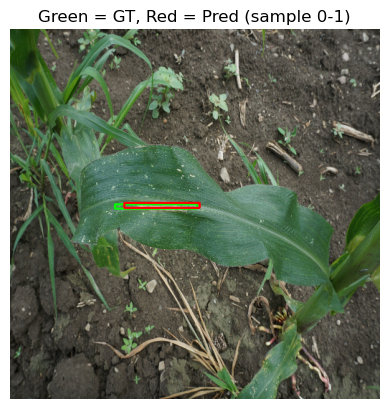

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


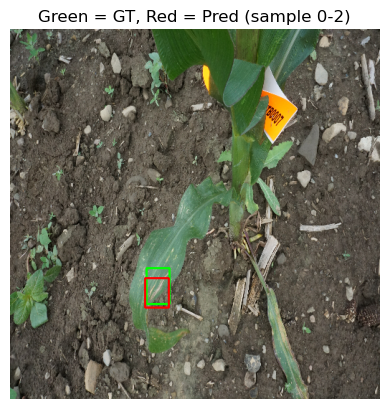

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


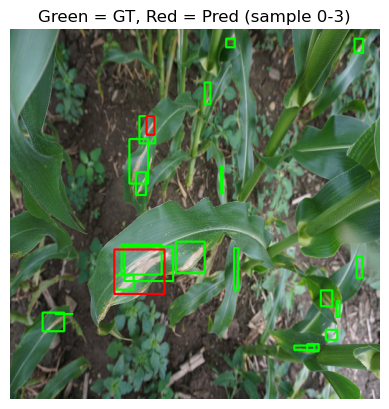

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


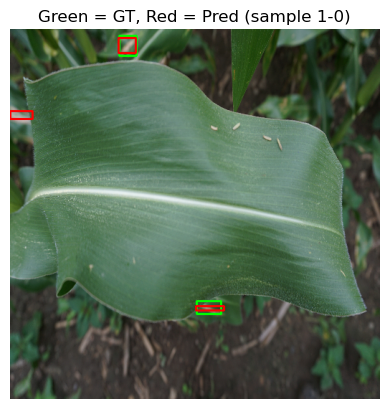

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


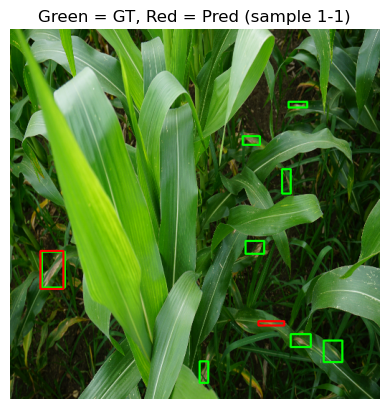

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


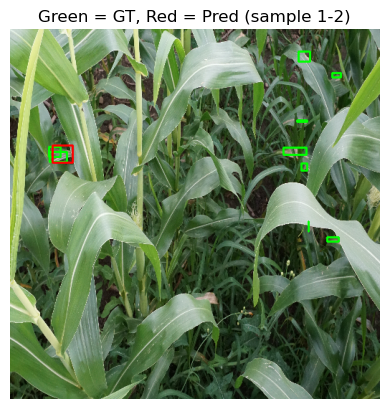

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


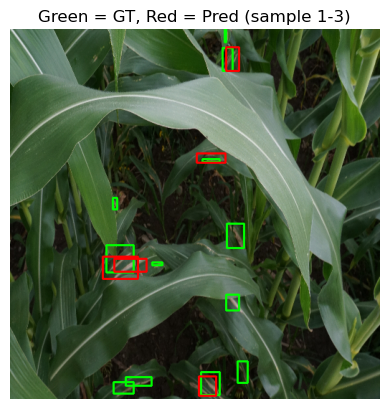

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


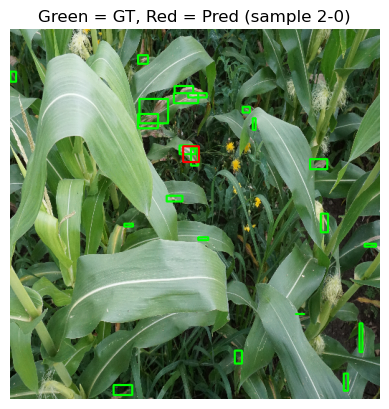

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


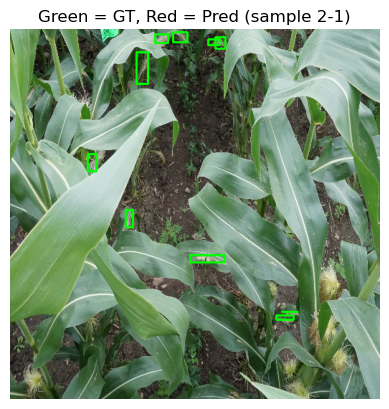

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


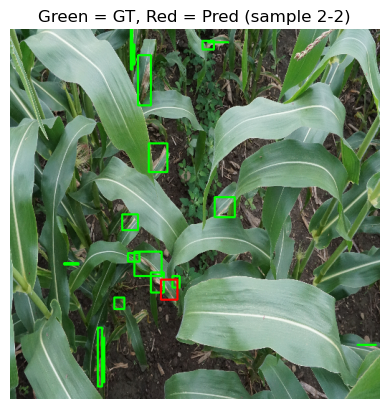

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


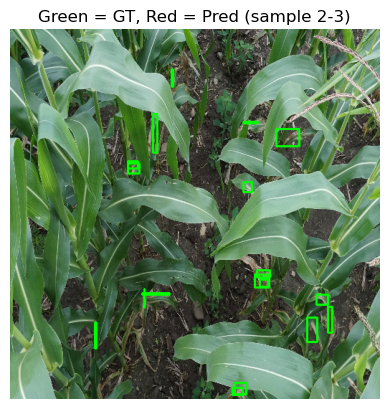

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


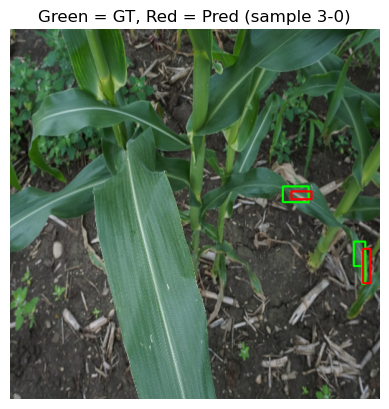

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


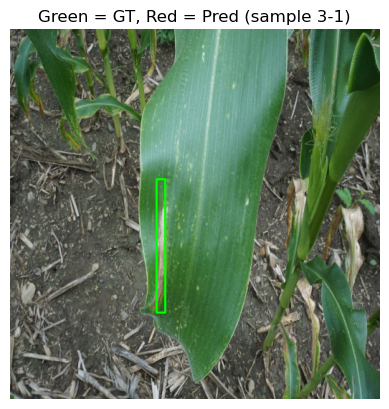

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


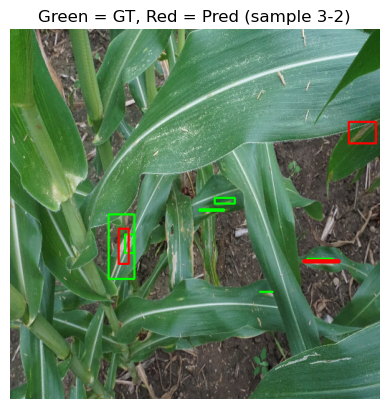

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


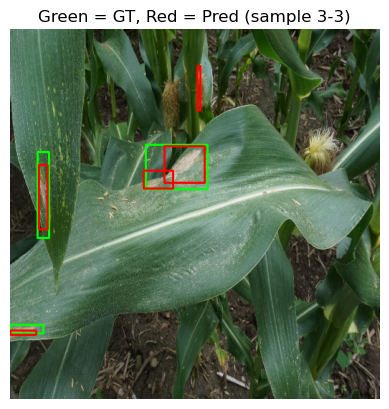

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


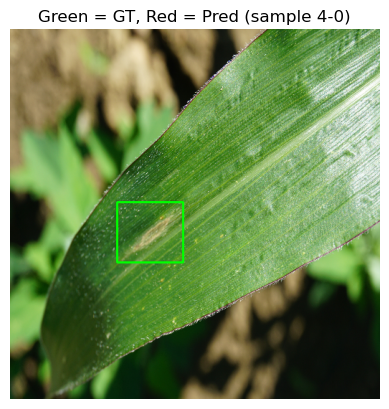

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


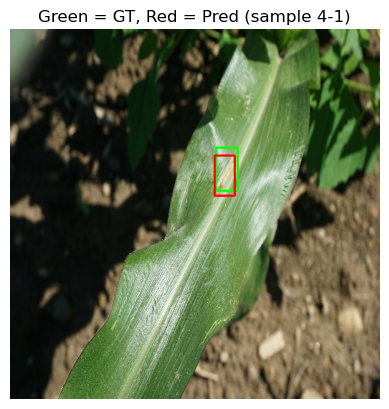

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


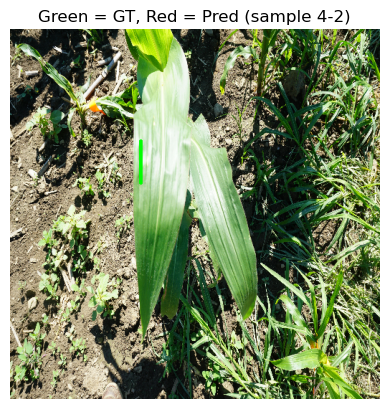

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


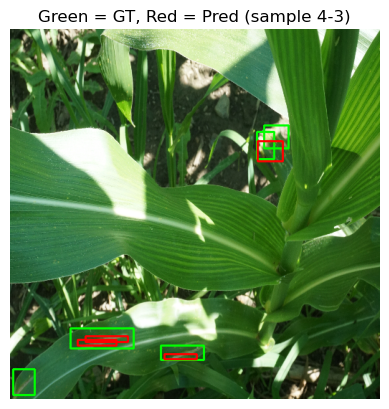

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


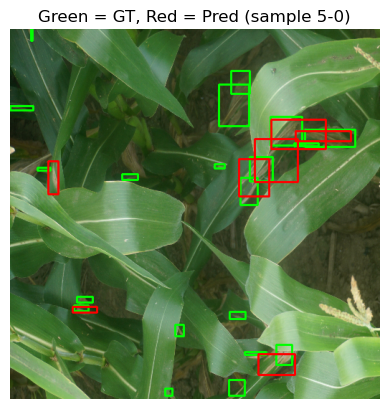

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


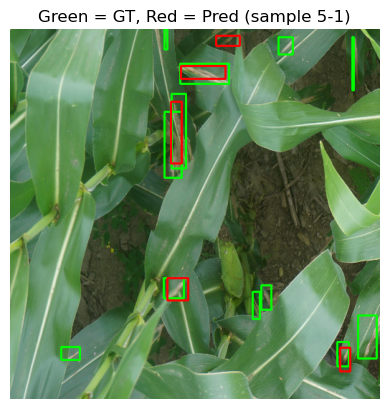

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


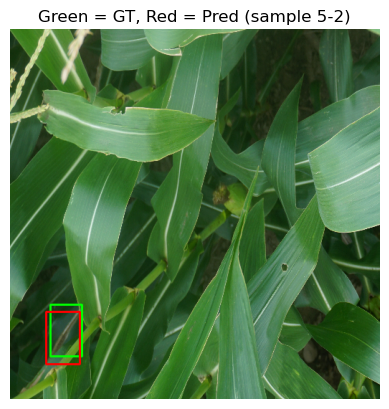

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


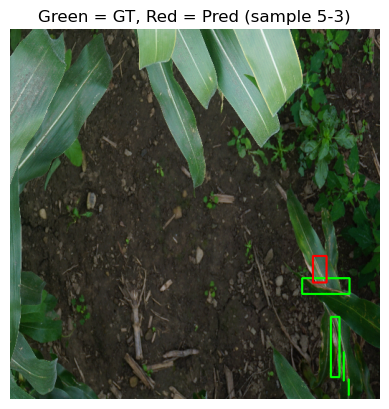

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


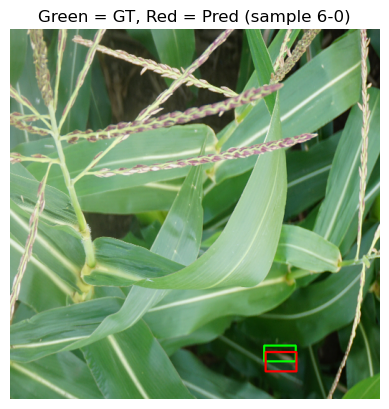

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


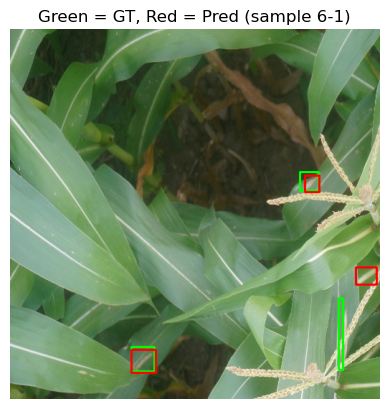

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


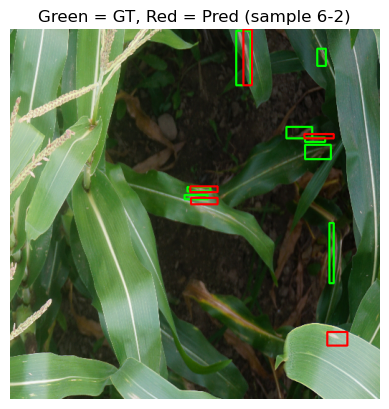

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step


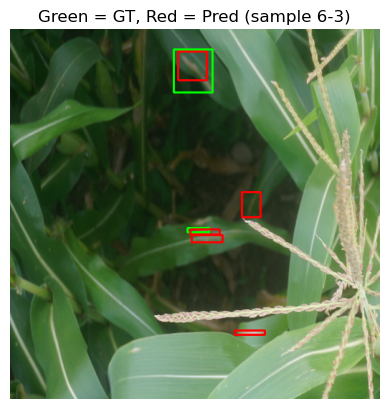

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


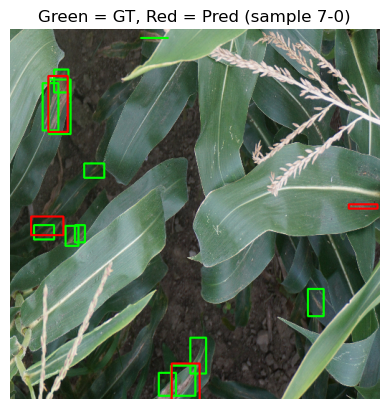

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step


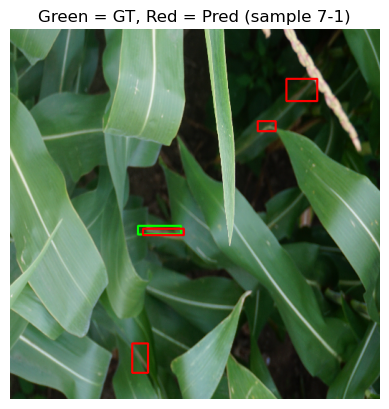

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


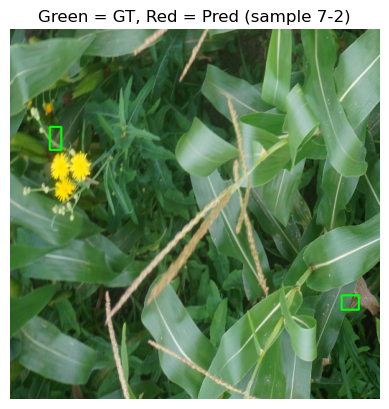

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


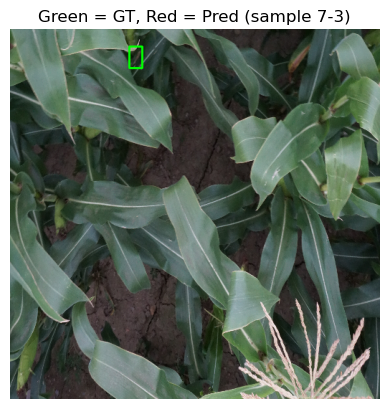

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


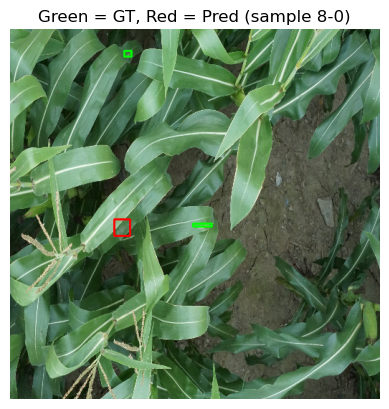

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


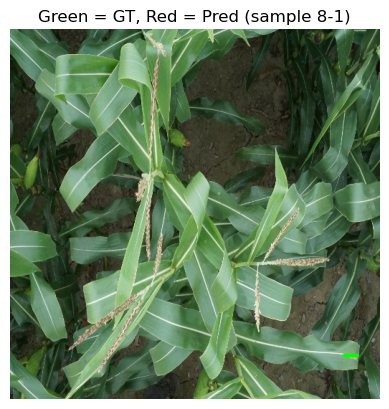

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


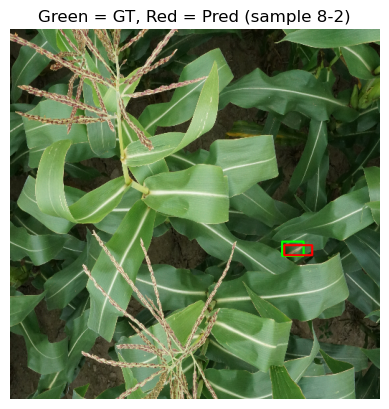

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step


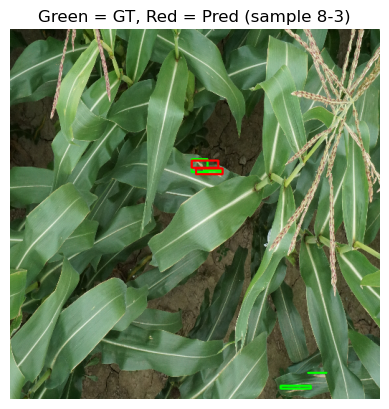

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


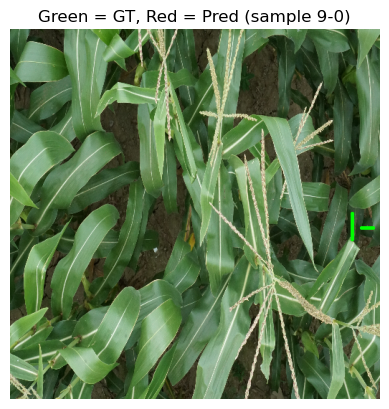

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


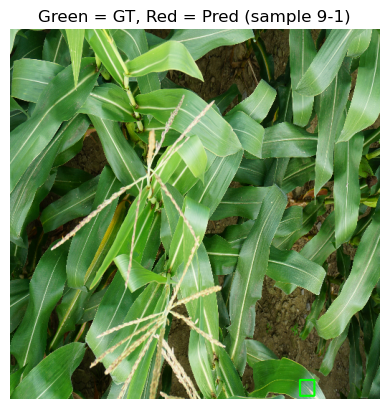

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


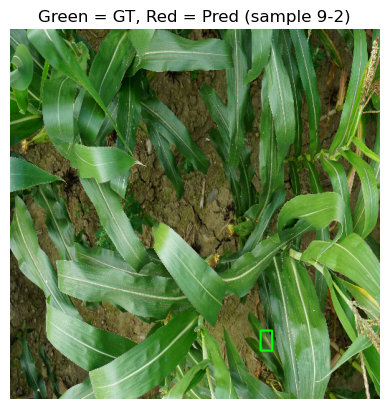

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


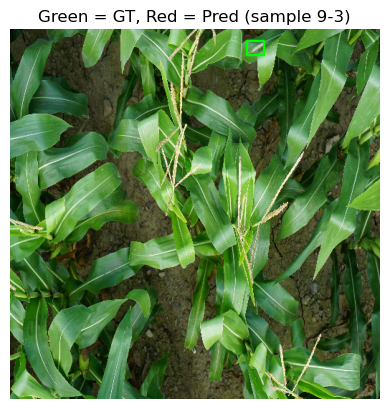

In [30]:
for i, (image_tensor, label_tensor) in enumerate(test_ds.take(10)):
    image_batch = image_tensor.numpy()
    label_batch = label_tensor.numpy()  

    for b in range(image_batch.shape[0]):
        img_np = image_batch[b]
        label_np = label_batch[b]
        
        pred = model.predict(img_np[np.newaxis])[0] 

        nms_boxes, scores = apply_nms(pred, conf_thresh=0.3, iou_thresh=0.4)

        vis_img = draw_nms_boxes(img_np, label_np, nms_boxes)  # custom function below

        plt.imshow(vis_img)
        plt.axis('off')
        plt.title(f"Green = GT, Red = Pred (sample {i}-{b})")
        plt.show()
